# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

## Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Background
The client is a used car dealership, with an interest in better understanding what is important to a buyer, in order to better inform pricing and promotion.

### Business Objectives
Since we can't actually interview the client, here are some of the possible business objectives which this effort might achieve.
1. Sell more cars
2. Sell cars more quickly to reduce lot inventory costs and depreciation
3. Increase profit margin on sale
4. Decrease cost of purchase
5. Improve promotion effectiveness by advertising what buyers are looking for.
6. Improve customer satisfaction
7. Improve retention / repeat buyers
8. Increase sales agent productivity / retention

### Business success criteria
Possible metrics and goals associated with each business objective
1. Increase total #cars sold
2. Decrease average time on lot
3. Increase average profit per sale
4. Decrease average purchase price on intake
5. Improve promotional effectiveness (channel dependent metric)
6. Increase post sale customer satisfaction at +1 week, +1 month, +1 year
7. Increase percentage of buyers who repeat
8. Increase average revenue / profit / commission per agent.  Increase average agent tenure



## Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

### Data Objectives derived from Business Understanding

1. Determine the relative importance of factors (columns) affecting the prices of used cars in the USA.
2. Examine regional variation.  Develop hypotheses about any subsetting necessary to restrict the training set to increase relevance for this client.
2. Build and test models which can be used to predict the price of additional cars given the named factors.
3. Use the best predictive models to build hypotheses about consumer prefences.

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

### Data Preparation / Inspection
1. Inspect the data.  Look for completeness of the dataset.  
2. Fill in or drop data as needed to create consistency for data analysis
3. Remove redundant columns
4. Encode categorical columns to enable numeric analysis
5. Apply any needed subsetting to use only relevant data
6. Determine cross-validation strategy and create training / test subsets

In [622]:
# import the necessary packages
from statsmodels.tsa.seasonal import seasonal_decompose

import statsmodels.api as sm
import matplotlib.pyplot as plt
%matplotlib inline 

import pandas as pd
import numpy as np

import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.filters.filtertools import convolution_filter
import statsmodels.graphics.tsaplots as tsaplots
from statsmodels.tsa.seasonal import _extrapolate_trend
from sklearn.linear_model import LinearRegression

In [623]:
# load the data
df = pd.read_csv('data/vehicles.csv')

In [624]:
df

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,NaN,sedan,NaN,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,NaN,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.0,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy


In [625]:
#describe the data
df.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [626]:
#count the number of missing values in the dataset
df.isnull().sum()


id                   0
region               0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
state                0
dtype: int64

In [627]:
# conside dropping the rows with missing values
df_nonull = df.dropna()
lost_rows = df.count().max() - df_nonull.count().max()
print(f"Lost rows: {lost_rows}")
print(f"resulting rows: {df_nonull.count().max()}")

Lost rows: 392012
resulting rows: 34868


In [628]:
low_price = 500

# get the count of rows with 'price' below a threshold
low_price_rows = df_nonull[df_nonull['price'] < low_price].count().max()
print(f"Rows with price < {low_price}: {low_price_rows}")

# drop the rows with low prices
df_nonull = df_nonull[df_nonull['price'] >= low_price]
print(f"resulting rows: {df_nonull.count().max()}")


Rows with price < 500: 3167
resulting rows: 31701


### Data subset decision

Although removing zeroes and low price cars results in a significant reduction in the size of the dataset, 32k records is still be enough to form a representative subset and build predictive models.  If the data looks skewed, I may have to come back and revisit this.

## Cleaning up Individual Columns

In [629]:
#get info about the dataset
print(df_nonull.info())
df_nonull


<class 'pandas.core.frame.DataFrame'>
Index: 31701 entries, 215 to 426833
Data columns (total 18 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   id            31701 non-null  int64  
 1   region        31701 non-null  object 
 2   price         31701 non-null  int64  
 3   year          31701 non-null  float64
 4   manufacturer  31701 non-null  object 
 5   model         31701 non-null  object 
 6   condition     31701 non-null  object 
 7   cylinders     31701 non-null  object 
 8   fuel          31701 non-null  object 
 9   odometer      31701 non-null  float64
 10  title_status  31701 non-null  object 
 11  transmission  31701 non-null  object 
 12  VIN           31701 non-null  object 
 13  drive         31701 non-null  object 
 14  size          31701 non-null  object 
 15  type          31701 non-null  object 
 16  paint_color   31701 non-null  object 
 17  state         31701 non-null  object 
dtypes: float64(2), int64(2), obj

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
215,7316482063,birmingham,4000,2002.0,toyota,echo,excellent,4 cylinders,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
219,7316429417,birmingham,2500,1995.0,bmw,525i,fair,6 cylinders,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al
268,7315946365,birmingham,9000,2008.0,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,clean,automatic,JM1NC25F570128735,rwd,compact,convertible,white,al
337,7315354216,birmingham,8950,2011.0,ford,f-150,excellent,6 cylinders,gas,164000.0,clean,automatic,1FTMF1CM6BKD55331,fwd,full-size,truck,white,al
338,7315349921,birmingham,4000,1972.0,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,clean,automatic,1.14023E+13,rwd,full-size,coupe,silver,al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,wyoming,23495,2015.0,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,clean,automatic,1FTFX1EF5FFC24427,4wd,full-size,truck,black,wy
426788,7303227528,wyoming,12995,2016.0,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,clean,automatic,1G1BE5SM0G7266569,fwd,compact,sedan,silver,wy
426792,7303114896,wyoming,32999,2014.0,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,clean,automatic,1FT8W3DT3EEB41548,4wd,full-size,pickup,brown,wy
426793,7303112347,wyoming,15999,2018.0,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,clean,automatic,1G1BE5SM7J7133704,fwd,mid-size,sedan,black,wy


#### Year

In [630]:
#convert the date column to four digit integer
df_nonull['year'] = df_nonull['year'].astype(int)
df_nonull['year'].dtype

dtype('int64')

### Encode non-numeric columns

Process through the non-numeric columns to prepare them for inclusion in correlation and model building.  For region, state, color, manufacturer, and type, we target encode these to average price, to yield a numeric column which has some built in reference to market value.  For the other processed columns, we create a label encoding which captures the spectrum implied in the original categories.

#### Manufacturer

In [632]:
# get the counts by manufacturer
print(df_nonull['manufacturer'].value_counts())

#create a new column which target encodes the manufacturer
df_nonull['manufacturer'] = df_nonull['manufacturer'].astype('category')

mean_encoded = df_nonull.groupby('manufacturer')['price'].mean()
df_nonull['mfr_encode'] = df_nonull['manufacturer'].map(mean_encoded)

#convert 'mfr_encode' to integer
df_nonull['mfr_encode'] = df_nonull['mfr_encode'].astype(int)
df_nonull['mfr_encode'].dtype


manufacturer
ford               6915
chevrolet          4797
toyota             2647
honda              1811
nissan             1556
ram                1394
gmc                1351
jeep               1238
subaru              858
dodge               842
bmw                 759
volkswagen          714
hyundai             714
mercedes-benz       707
kia                 570
lexus               531
chrysler            503
cadillac            451
audi                388
mazda               372
buick               359
mitsubishi          311
volvo               237
lincoln             236
acura               232
infiniti            206
pontiac             197
mini                166
rover               147
porsche             132
saturn               97
jaguar               82
mercury              81
fiat                 45
tesla                16
alfa-romeo           15
ferrari               9
harley-davidson       7
datsun                3
aston-martin          3
land rover            2
Nam

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/982646043.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



dtype('int64')

#### State

In [633]:
#get the counts by state
print(df_nonull['state'].value_counts())

#create a new column which target encodes the state
df_nonull['state'] = df_nonull['state'].astype('category')

mean_encoded = df_nonull.groupby('state')['price'].mean()
df_nonull['state_encode'] = df_nonull['state'].map(mean_encoded)

#convert 'state_encode' to integer
df_nonull['state_encode'] = df_nonull['state_encode'].astype(int)
df_nonull['state_encode'].dtype


state
ca    3323
fl    2709
ny    1715
tx    1296
mi    1221
wi    1111
nc    1091
oh    1032
ia    1030
pa     988
va     979
or     951
tn     859
mn     795
nj     788
co     755
vt     676
ma     654
il     631
ks     602
az     599
id     594
in     565
ky     543
ok     501
sc     448
al     419
ak     403
mo     381
mt     347
wa     311
ct     298
ga     269
nm     238
ri     231
nv     216
hi     206
me     197
nh     192
dc     181
md     161
ut     153
sd     149
ar     145
ne     134
la     133
nd     133
de     109
wv      87
wy      87
ms      65
Name: count, dtype: int64


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/1488015538.py:7: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



dtype('int64')

#### Number of Cylinders

In [634]:
#get the counts by cylinders
print(df_nonull['cylinders'].value_counts())

#create a new numeric column which extracts the number of cylinders
df_nonull['num_cyl'] = df_nonull['cylinders'].str.extract('(\d+)').astype(float)

df_nonull['num_cyl'].dtype


cylinders
4 cylinders     10545
6 cylinders     10534
8 cylinders      9855
10 cylinders      334
5 cylinders       270
other              92
3 cylinders        60
12 cylinders       11
Name: count, dtype: int64


dtype('float64')

#### Condition

In [635]:
#get the counts by condition
print(df_nonull['condition'].value_counts())

# List of conditions ordered by increasing quality
conditions_order = ['salvage', 'fair', 'good', 'excellent', 'like new', 'new']

# Create a dictionary that maps each condition to an integer
condition_mapping = {condition: idx for idx, condition in enumerate(conditions_order)}

# Apply the mapping to the conditions column
df_nonull['conditions_encoded'] = df_nonull['condition'].map(condition_mapping).astype(int)

df_nonull['conditions_encoded'].dtype

condition
excellent    17530
good          9731
like new      3753
fair           483
new            168
salvage         36
Name: count, dtype: int64


dtype('int64')

#### Color

In [636]:
# get the counts by color
print(df_nonull['paint_color'].value_counts())

# label encode the color column
df_nonull['paint_color'] = df_nonull['paint_color'].astype('category')
df_nonull['color_encode'] = le.fit_transform(df_nonull['paint_color'])
df_nonull['color_encode'].dtype

#create a new column which target encodes the color
mean_encoded = df_nonull.groupby('paint_color')['price'].mean()
df_nonull['color_encode'] = df_nonull['paint_color'].map(mean_encoded)

#convert 'color_encode' to integer
df_nonull['color_encode'] = df_nonull['color_encode'].astype(int)
df_nonull['color_encode'].dtype


paint_color
white     8839
black     5835
silver    4332
grey      3874
blue      3079
red       2874
custom     862
green      833
brown      737
yellow     214
orange     150
purple      72
Name: count, dtype: int64


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/1236760444.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



dtype('int64')

#### Type

In [637]:
#get the counts by type
print(df_nonull['type'].value_counts())

# target encode the type column
mean_encoded = df_nonull.groupby('type')['price'].mean()
df_nonull['type_encode'] = df_nonull['type'].map(mean_encoded)


type
SUV            8520
sedan          7510
truck          6837
pickup         2556
van            1655
coupe          1323
hatchback      1086
convertible     794
wagon           616
mini-van        587
other            93
offroad          81
bus              43
Name: count, dtype: int64


#### Size

In [638]:
# get the counts by size
print(df_nonull['size'].value_counts())

sizes = ['sub-compact', 'compact', 'mid-size', 'full-size']

# label encode the size column using sizes as the categories
df_nonull['size'] = df_nonull['size'].astype('category')
df_nonull['size_encode'] = le.fit_transform(df_nonull['size'])
df_nonull['size_encode'].dtype

size
full-size      18945
mid-size        8796
compact         3379
sub-compact      581
Name: count, dtype: int64


dtype('int64')

#### Title Status

In [639]:
#get the counts by title status
print(df_nonull['title_status'].value_counts())

# label encode the title status column  
df_nonull['title_status'] = df_nonull['title_status'].astype('category')
df_nonull['title_status_encode'] = le.fit_transform(df_nonull['title_status'])
df_nonull['title_status_encode'].dtype

title_status
clean         30533
rebuilt         781
salvage         238
lien            134
missing          13
parts only        2
Name: count, dtype: int64


dtype('int64')

#### Region

In [640]:
#get the counts by region
print(df_nonull['region'].value_counts())

# target encode the region column by price
mean_encoded = df_nonull.groupby('region')['price'].mean()
df_nonull['region_encode'] = df_nonull['region'].map(mean_encoded)
df_nonull['region_encode'].dtype

region
vermont               676
jacksonville          478
anchorage / mat-su    399
nashville             361
louisville            359
                     ... 
san marcos              1
southwest TX            1
southeast alaska        1
logan                   1
terre haute             1
Name: count, Length: 390, dtype: int64


dtype('float64')

### Look for Correlations

In [641]:
# create a subset of just the numeric columns
df_numeric = df_nonull.select_dtypes(include=[np.number])
df_numeric

,id,price,year,odometer,mfr_encode,state_encode,num_cyl,conditions_encoded,color_encode,type_encode,size_encode,title_status_encode,region_encode
215,7316482063,4000,2002,155000.0,14548,19632,4.0,3,14398,10224.163915,0,0,23546.913295
219,7316429417,2500,1995,110661.0,15979,19632,6.0,1,21141,10224.163915,2,0,23546.913295
268,7315946365,9000,2008,56700.0,10298,19632,4.0,3,21141,17127.944584,0,0,23546.913295
337,7315354216,8950,2011,164000.0,22001,19632,6.0,3,21141,27465.187802,1,0,23546.913295
338,7315349921,4000,1972,88100.0,18310,19632,6.0,1,13971,16949.226002,1,0,23546.913295
...,...,...,...,...,...,...,...,...,...,...,...,...,...
426785,7303314912,23495,2015,146795.0,22001,22986,8.0,4,18715,27465.187802,1,0,22986.758621
426788,7303227528,12995,2016,61127.0,19572,22986,4.0,4,13971,10224.163915,0,0,22986.758621
426792,7303114896,32999,2014,154642.0,22001,22986,8.0,3,13541,24027.122457,1,0,22986.758621
426793,7303112347,15999,2018,36465.0,19572,22986,4.0,3,18715,10224.163915,2,0,22986.758621


#### Pair Plot to see correlations

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed

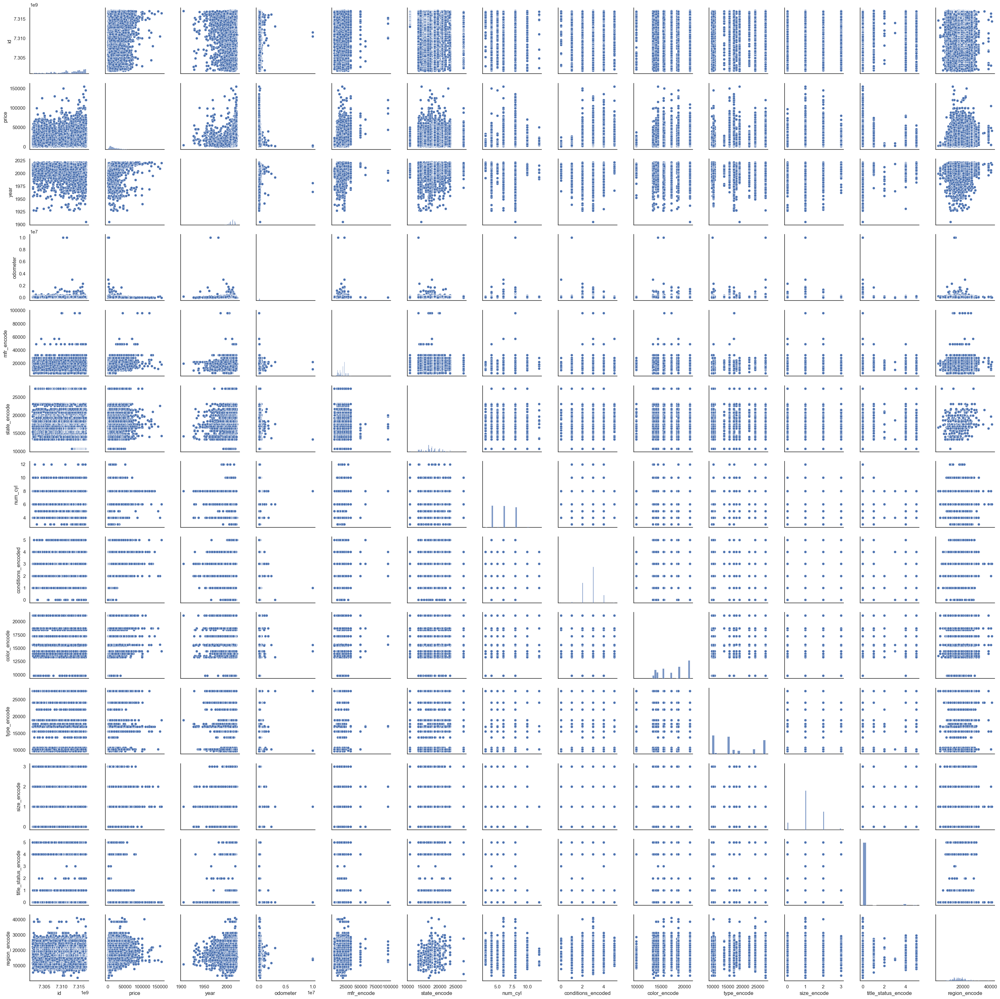

In [653]:
# create the pairplot
import seaborn as sns
sns.pairplot(df_numeric)
plt.savefig('images/pairplot.png')
plt.show()

#### Heatmap for further correlation viewing

/opt/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:260: FutureWarning:

Format strings passed to MaskedConstant are ignored, but in future may error or produce different behavior



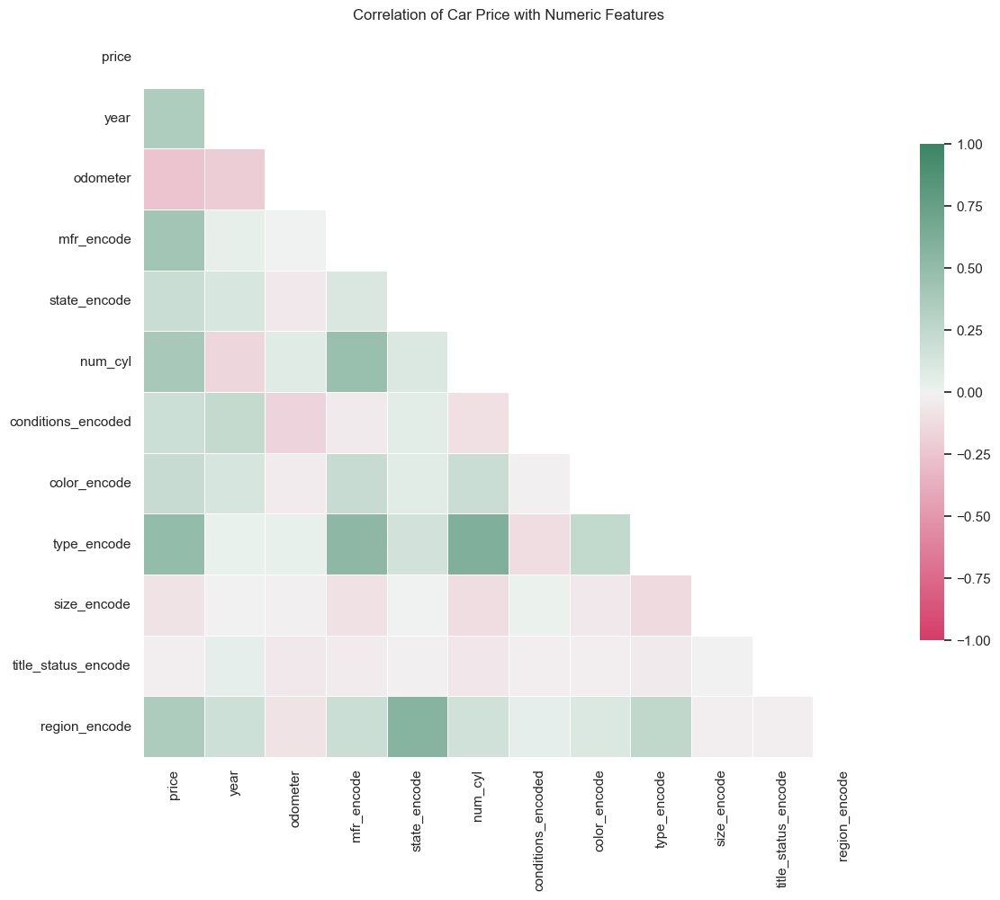

In [654]:
#diagonal heatmap from https://seaborn.pydata.org/examples/many_pairwise_correlations.html
sns.set_theme(style="white")

d = df_numeric.drop('id', axis=1)

# Compute the correlation matrix
corr = d.corr()
corr['price'].sort_values(ascending=False)


# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(12,12))

# generate a custom diverging colormap from dark red to dark green
cmap = sns.diverging_palette(0, 150, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, annot=True, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            fmt=".2f", square=True, linewidths=.5, cbar_kws={"shrink": .5}, cbar=True)
plt.title('Correlation of Car Price with Numeric Features')

plt.tight_layout()
plt.savefig('images/heatmap.jpg')
plt.show()

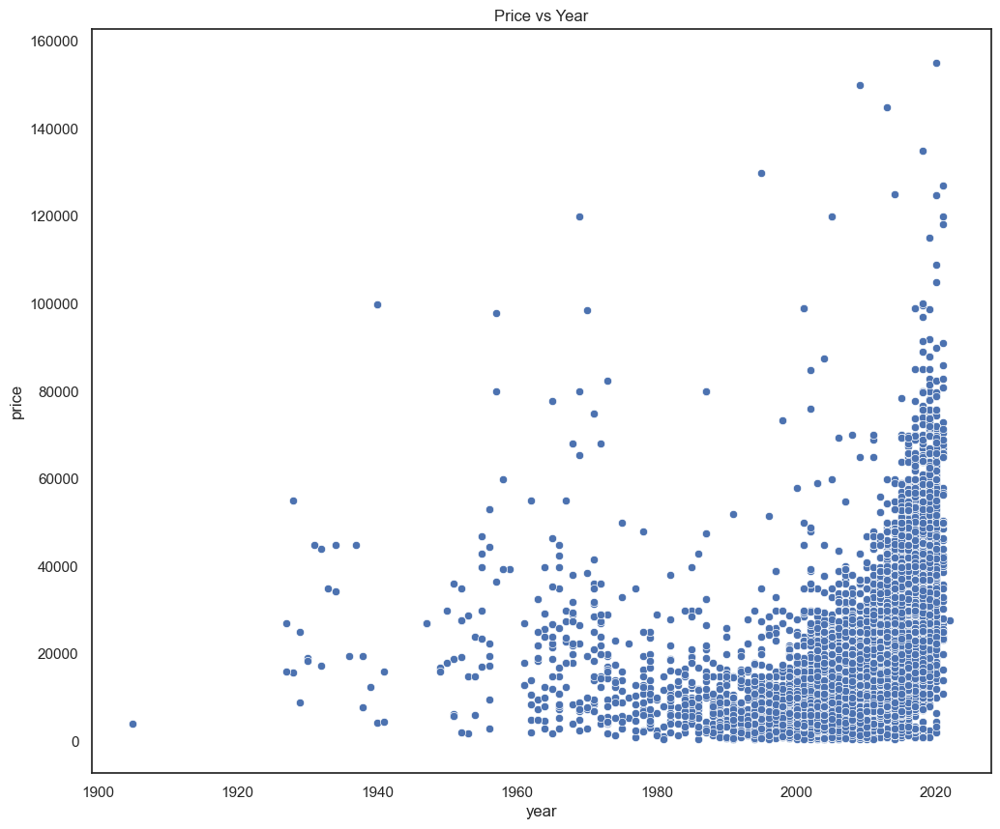

In [657]:
# show the correlation of price with year
plt.figure(figsize=(12, 10))
sns.scatterplot(data=df_nonull, x='year', y='price')
plt.title('Price vs Year')
plt.savefig('images/price_vs_year.jpg')
plt.show()


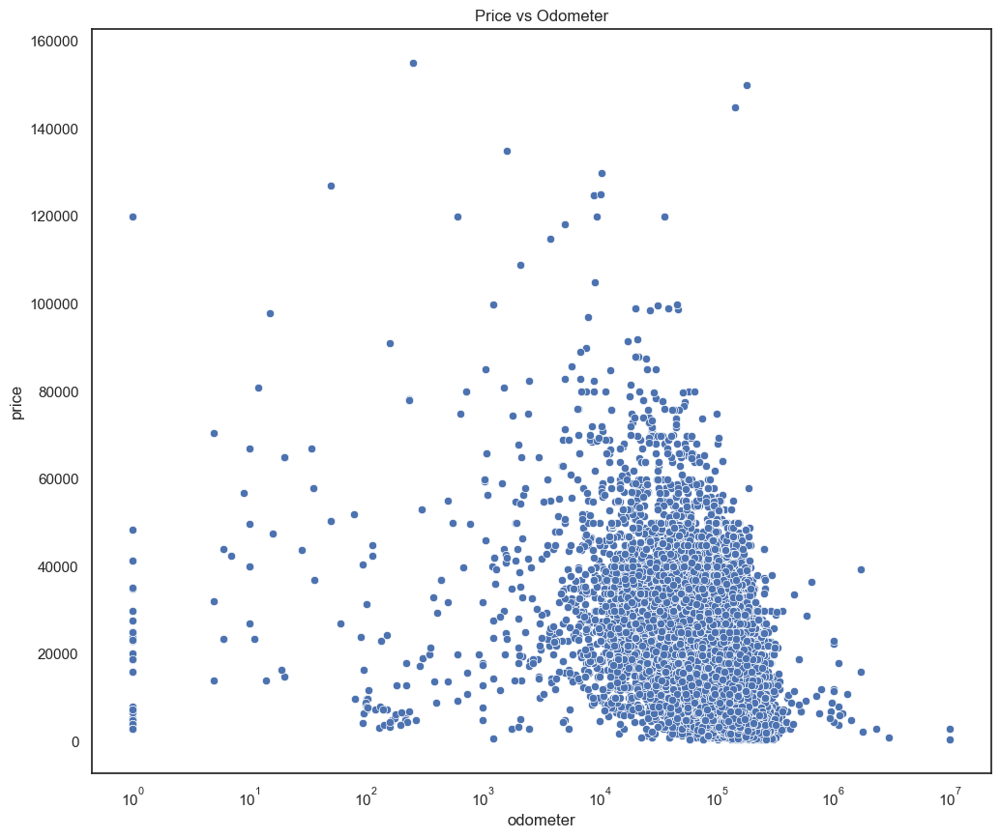

In [658]:
# show the correlation of price with odometer
plt.figure(figsize=(12, 10))
sns.scatterplot(data=df_nonull, x='odometer', y='price')
plt.xscale('log')
plt.title('Price vs Odometer')
plt.savefig('images/price_vs_odometer.jpg')
plt.show()


/opt/anaconda3/lib/python3.11/site-packages/seaborn/categorical.py:641: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



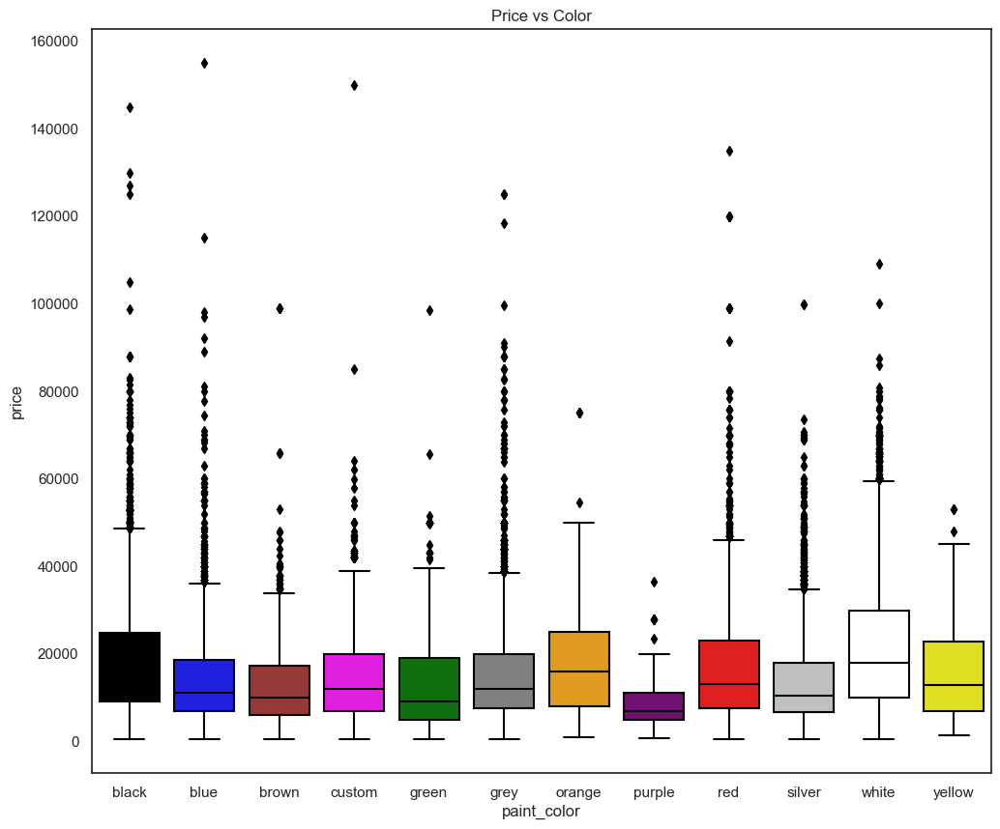

In [660]:
# Define the colors for each paint color
color_palette = {
    'white': 'white',
    'black': 'black',
    'silver': 'silver',
    'grey': 'grey',
    'blue': 'blue',
    'red': 'red',
    'custom': 'magenta',  # example for a 'custom' color
    'green': 'green',
    'brown': 'brown',
    'yellow': 'yellow',
    'orange': 'orange',
    'purple': 'purple'
}

#plot price versus color
plt.figure(figsize=(12, 10))
sns.boxplot(data=df_nonull, x='paint_color', y='price', palette=color_palette)
plt.title('Price vs Color')
plt.savefig('images/price_vs_color.jpg')
plt.show()


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1057: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



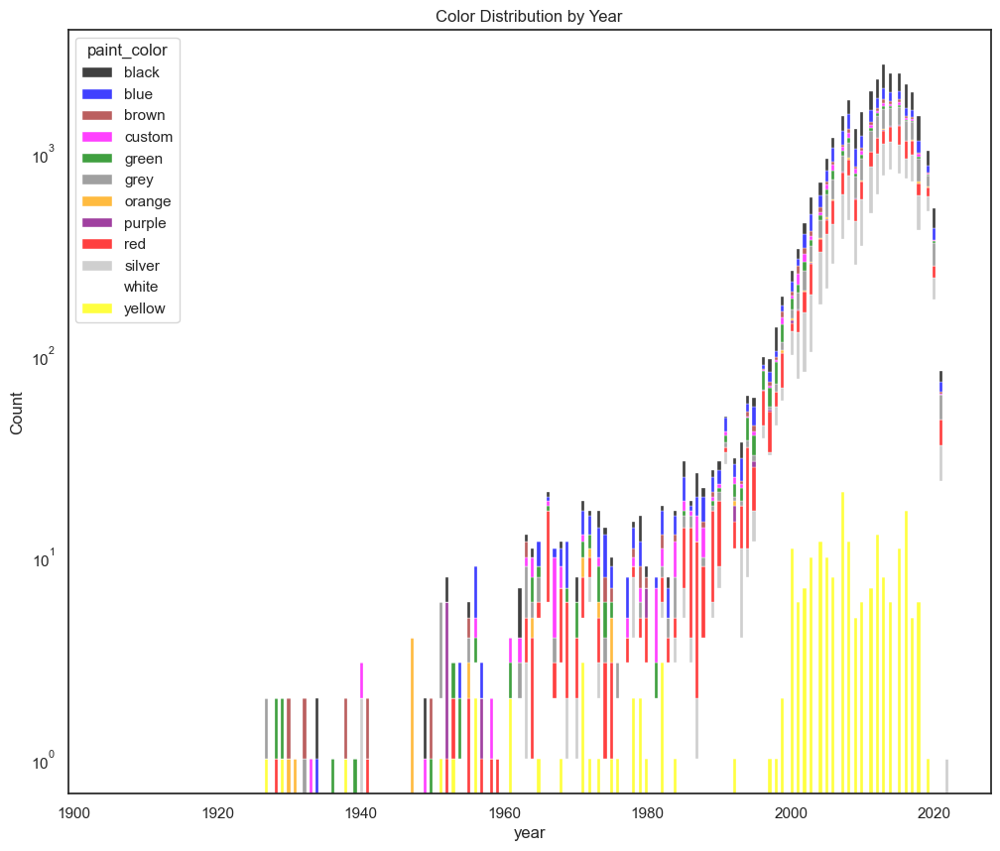

In [661]:

#group by 5 year intervals and plot the average price
df_nonull['year_group'] = pd.cut(df_nonull['year'], bins=range(1980, 2025, 5))
plt.figure(figsize=(12, 10))
sns.histplot(data=df_nonull, x='year', hue='paint_color', multiple='stack', palette=color_palette)
#make the y axis log scale
plt.yscale('log')
plt.title('Color Distribution by Year')
plt.savefig('images/color_distribution_by_year.jpg')
plt.show()


In [673]:
# draw a 3d plot of the price with the year and manufacturer using plotly
import plotly.express as px
fig = px.scatter_3d(df_nonull, x='year', y='mfr_encode', z='price', color='price')
fig.write_image('images/3d_plot.jpg')
fig.show()


In [663]:
# show the average price by manufacturer by year
data = df_nonull
fig = px.scatter(x=data['manufacturer'], y = data['price'], color=data['year'])
fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers+lines'))
fig.write_image('images/price_by_manufacturer.jpg')
fig.show()



In [676]:
# define a function to generate plots of the price by manufacturer by year

def plots_by_year(data, subtitle):
    fig = px.scatter(x=data['manufacturer'], y = data['price'], color=data['year'])
    fig.update_traces(marker=dict(size=12,
                                  line=dict(width=2,
                                            color='DarkSlateGrey')),
                      selector=dict(mode='markers+lines'))
    #set the title to 'Price by Manufacturer by Year: {subtitle}'
    fig.update_layout(title=f"Price by Manufacturer by Year: {subtitle}")
    fig.write_image(f'images/price_by_manufacturer_scatter{subtitle}.jpg')
    fig.show()

    # plot a line graph of the average price by year and manufacturer
    data = data.groupby(['year', 'manufacturer'])['price'].mean().reset_index()
    fig = px.line(data, x='year', y='price', color='manufacturer')
    
    # set the title to 'Price by Manufacturer by Year: {subtitle}'
    fig.update_layout(title=f"Price by Manufacturer by Year: {subtitle}")
    fig.write_image(f'images/price_by_manufacturer_line{subtitle}.jpg')
    fig.show()


In [677]:
plots_by_year(df_nonull, 'All Years')

/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3898567502.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Conclusions / Hypotheses

Three distinct markets
1. Vintage before around 1980
* Specfic brands
* high premium on condition / mileage

2. Luxury / Exotic outliers
* high end
* small numbers
* price outliers
    
3. Mainstream market
* high correlation between year, mileage and price
* newer == higher
    

In [772]:
# separate the data into before and after 1980
df_1980 = df_nonull[df_nonull['year'] < 1980]
#print the count of rows in the dataset
print(f"Rows before 1980: {df_1980.count().max()}")
plots_by_year(df_1980, 'Before 1980')

df_recent = df_nonull[df_nonull['year'] >= 1980]
#print the count of rows in the dataset
print(f"Rows after 1980: {df_recent.count().max()}")
plots_by_year(df_recent, 'After 1980')

Rows before 1980: 304


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3898567502.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Rows after 1980: 31397


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3898567502.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [773]:

# create a new dataframe with outliers removed from df_recent
df_outliers = df_recent[df_recent['price'] > 50000]
df_core = df_recent[df_recent['price'] <= 50000]

print(f"Outliers: {df_outliers.count().max()}")
plots_by_year(df_outliers, 'Outliers after 1980')

print(f"Core: {df_core.count().max()}")
plots_by_year(df_core, 'Core after 1980')


Outliers: 649


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3898567502.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



Core: 30748


/var/folders/v0/7hny_wjs4tg70rryd7blqpd00000gn/T/ipykernel_986/3898567502.py:15: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/opt/anaconda3/lib/python3.11/site-packages/plotly/express/_core.py:1958: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

### Helper Functions


In [680]:
def plot_predictions(y_test, y_pred, title):

    # convert into dataframe
    df = pd.DataFrame({'y_test': y_test, 'y_pred': y_pred})

    #re sort by y_test
    df_sorted = df.sort_values(by='y_test')

    y_test_sorted = df_sorted['y_test'].values
    y_pred_sorted = df_sorted['y_pred'].values

    # Plot the results as scatter plots
    plt.figure(figsize=(10, 6))
    plt.scatter(np.arange(len(y_test_sorted)), y_test_sorted, label='Actual', marker='o', alpha=0.5, zorder=2)
    plt.scatter(np.arange(len(y_pred_sorted)), y_pred_sorted, label='Predicted', marker='x', alpha=1.0,zorder=1)
    plt.xlabel('Index (or Sample Number)')
    plt.ylabel('Target Value')
    plt.title(f'{title}: Comparison of Actual vs Predicted Values')
    plt.legend()
    plt.grid(True)
    plt.show()
    

In [681]:
def perm_importance_with_transformed_columns(pipeline, estimator, X_test, y_test, title):
    # Step 1: Transform the test data using the preprocessing steps
    X_test_transformed = pipeline.named_steps['preprocessor'].transform(X_test)

    # Step 2: If you have PolynomialFeatures, apply that transformation too
    if 'poly' in pipeline.named_steps:
        X_test_transformed = pipeline.named_steps['poly'].transform(X_test_transformed)

    # Step 3: Calculate permutation importance on the transformed data
    result = permutation_importance(
        pipeline.named_steps[estimator],  # The final estimator in your pipeline
        X_test_transformed,             # The transformed test data
        y_test,
        n_repeats=10,
        random_state=42
    )

    # Step 4: Get the feature names from the transformed data
    if 'poly' in pipeline.named_steps:
        feature_names = pipeline.named_steps['poly'].get_feature_names_out(
            pipeline.named_steps['preprocessor'].get_feature_names_out()
        )
    else:
        feature_names = pipeline.named_steps['preprocessor'].get_feature_names_out()

    # Step 5: Display the permutation importance results for each feature
    sorted_idx = result.importances_mean.argsort()

    # Optional: Visualize the importance

    plt.figure(figsize=(10, 6))
    plt.boxplot(result.importances[sorted_idx].T, vert=False, labels=feature_names[sorted_idx])
    plt.title(f'{title}: Permutation Importance (Transformed Features)')
    plt.show()

# Model building

## Core group

### Split into test and train sets

In [774]:
# split df_core into X and y
df_core_nonan = df_core.dropna()

X = df_core_nonan.drop('price', axis=1)
y = df_core_nonan['price']
print(df_core_nonan.head())

# split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



             id      region  price  year   manufacturer       model  \
215  7316482063  birmingham   4000  2002         toyota        echo   
219  7316429417  birmingham   2500  1995            bmw        525i   
268  7315946365  birmingham   9000  2008          mazda  miata mx-5   
337  7315354216  birmingham   8950  2011           ford       f-150   
355  7315110575  birmingham   9400  2008  mercedes-benz   benz c350   

     condition    cylinders fuel  odometer  ... mfr_encode state_encode  \
215  excellent  4 cylinders  gas  155000.0  ...      14548        19632   
219       fair  6 cylinders  gas  110661.0  ...      15979        19632   
268  excellent  4 cylinders  gas   56700.0  ...      10298        19632   
337  excellent  6 cylinders  gas  164000.0  ...      22001        19632   
355       good  6 cylinders  gas  129473.0  ...      18310        19632   

    num_cyl conditions_encoded color_encode   type_encode size_encode  \
215     4.0                  3        14398  1022

### Import the necessary libraries for modelling

In [683]:
# imports for modeling

from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.pipeline import make_pipeline
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SequentialFeatureSelector, SelectFromModel
from sklearn.metrics import mean_absolute_error



### Setup the preprocessor

In [775]:


# preprocess the data to scale numerical features 
preprocessor = make_column_transformer(
    (StandardScaler(), X.select_dtypes(include='number').columns.drop('id')),  
    #drop non-numeric columns
    remainder='drop'
)

# build a pipeline which includes polynomial features
poly = PolynomialFeatures(degree=2, include_bias=False)

# build a pipeline which includes the linear regression model
linear = LinearRegression()

# build a pipeline which includes the ridge regression model
ridge = Ridge()



### Initialize the results dataframe

In [776]:
#setup a results dictionary which will store the mse, rmse and r2 values for each model
results = {}


### Linear Regression with Scaling ###

In [777]:

# build a pipeline which includes the linear regression model with polynomial features and standard scaler
linear_scaled = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('linear', linear)
])

# fit the linear regression model with polynomial features
linear_scaled.fit(X_train, y_train)

# show the output column names from the preprocessor
print(preprocessor.get_feature_names_out())

# evaluate the linear regression model with polynomial features
linear_score = linear_scaled.score(X_test, y_test)

# caculate the mean squared error
y_pred = linear_scaled.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)


['standardscaler__year' 'standardscaler__odometer'
 'standardscaler__mfr_encode' 'standardscaler__state_encode'
 'standardscaler__num_cyl' 'standardscaler__conditions_encoded'
 'standardscaler__color_encode' 'standardscaler__type_encode'
 'standardscaler__size_encode' 'standardscaler__title_status_encode'
 'standardscaler__region_encode']


Linear Scaled R^2:  0.64482
Linear Scaled MSE:  43844302.24100
Linear Scaled RMSE:  6621.50302
Linear Scaled MAE:  4884.44771



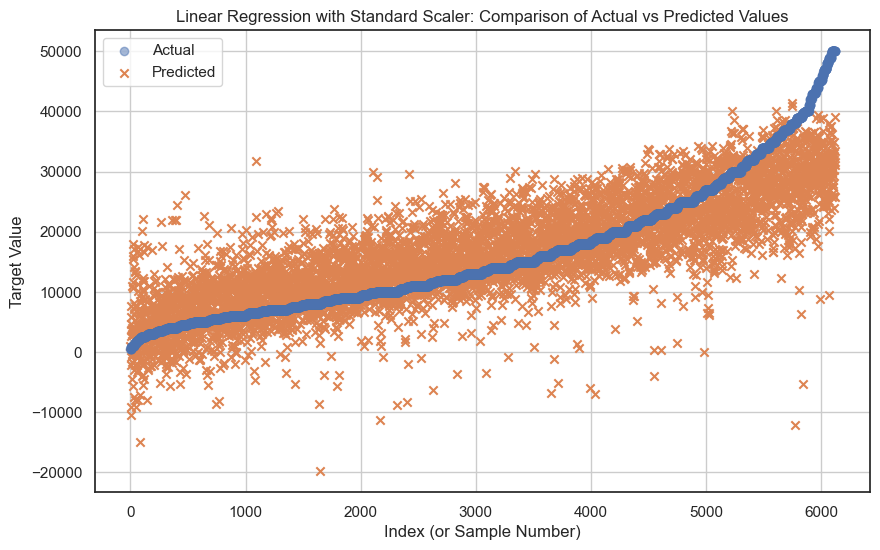

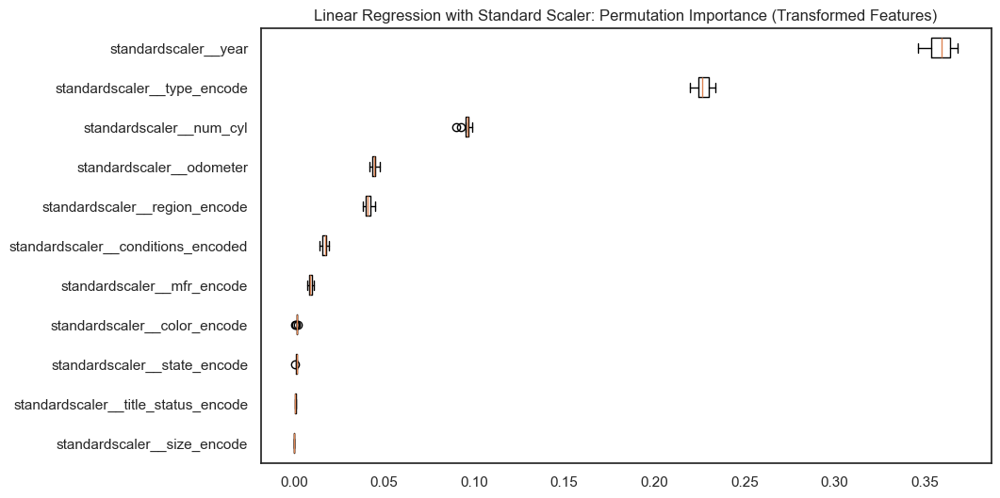

In [778]:
#append the results to the results dictionary
results['linear_scaled'] = {'r2': linear_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

print(f'Linear Scaled R^2: {linear_score: .5f}')
print(f'Linear Scaled MSE: {mse: .5f}')
print(f'Linear Scaled RMSE: {rmse: .5f}')
print(f'Linear Scaled MAE: {mae: .5f}')
print()

# plot the predictions
plot_predictions(y_test, y_pred, 'Linear Regression with Standard Scaler')

# get the true perms
perm_importance_with_transformed_columns(linear_scaled, 'linear', X_test, y_test, 'Linear Regression with Standard Scaler')

### Ridge with Scaling ###

Ridge Scaled R^2:  0.64482
Ridge Scaled MSE:  43844365.14066
Ridge Scaled RMSE:  6621.50777
Ridge Scaled MAE:  4884.45048



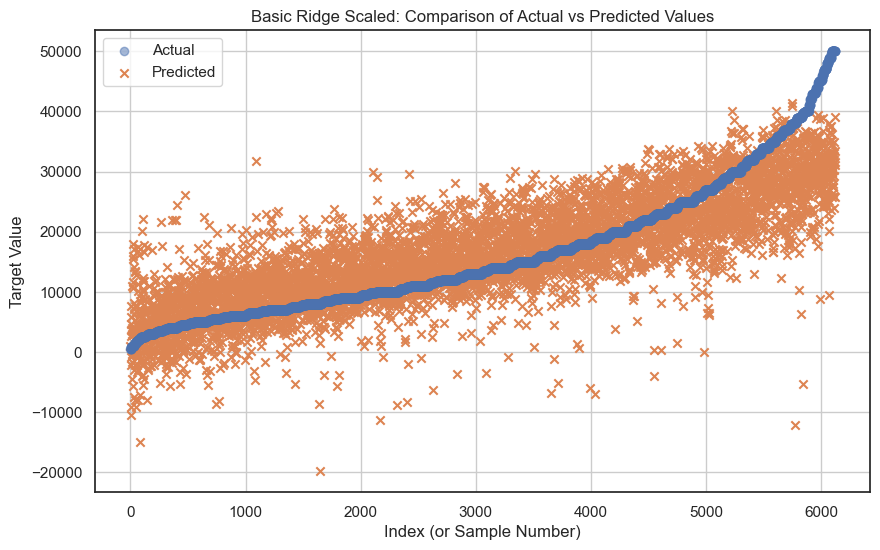

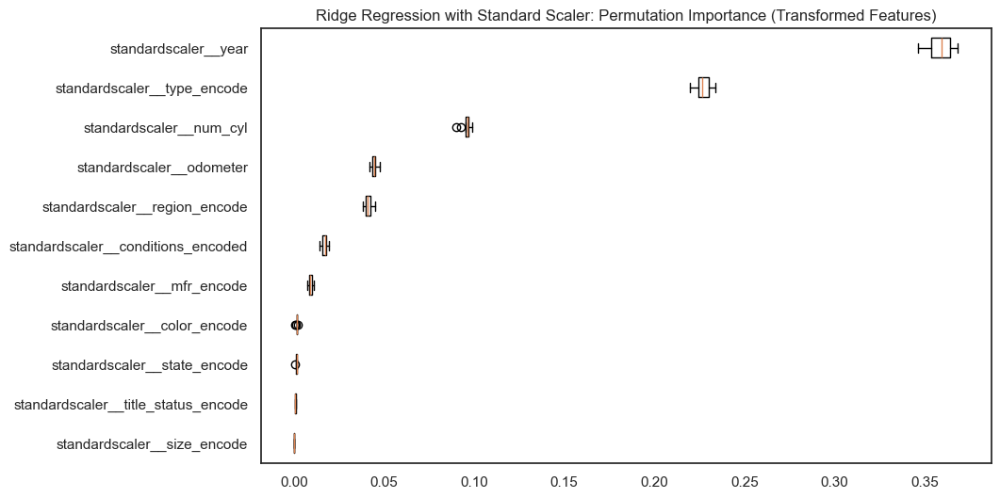

In [779]:
# build a pipeline which includes the ridge regression model with polynomial features and standard scaler
ridge_scaled = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('ridge', ridge)
])

# fit the ridge regression model with polynomial features
ridge_scaled.fit(X_train, y_train)

# evaluate the ridge regression model with polynomial features
ridge_score = ridge_scaled.score(X_test, y_test)

# caculate the mean squared error
y_pred = ridge_scaled.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

#append the results to the results dictionary
results['ridge_scaled'] = {'r2': ridge_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

print(f'Ridge Scaled R^2: {ridge_score: .5f}')
print(f'Ridge Scaled MSE: {mse: .5f}')
print(f'Ridge Scaled RMSE: {rmse: .5f}')
print(f'Ridge Scaled MAE: {mae: .5f}')
print()

#plot the predictions
plot_predictions(y_test, y_pred, 'Basic Ridge Scaled')

# get the true perms
perm_importance_with_transformed_columns(ridge_scaled, 'ridge', X_test, y_test, 'Ridge Regression with Standard Scaler')


### Ridge with different alphas

In [780]:

#compare different amounts of regularization
alphas = np.logspace(-4, 4, 9)

# Set up the hyperparameter grid for alpha values
param_grid = {
    'ridge__alpha': [0.1, 1.0, 10, 100]  # specify the alpha values to search over
}

# Use GridSearchCV to search over the specified alpha values
grid_search = GridSearchCV(ridge_scaled, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model using the training data
grid_search.fit(X_train, y_train)

# Get the best model with the optimal alpha
best_model = grid_search.best_estimator_

# Evaluate the best model on the test data
ridge_score = best_model.score(X_test, y_test)



Best alpha: 100
Best Ridge Score:  0.64476
Best Mean Squared Error:  43851371.71009
Best Root Mean Squared Error:  6622.03682
Best Mean Absolute Error:  4884.77800


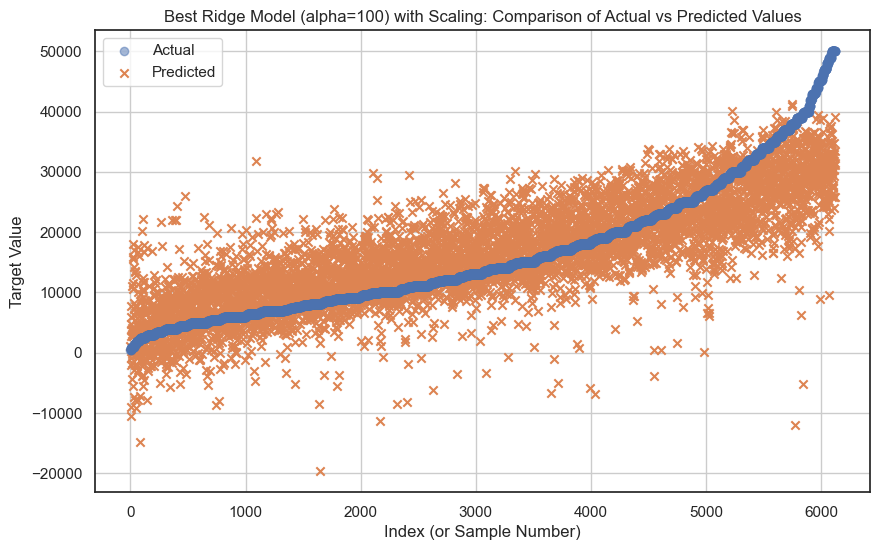

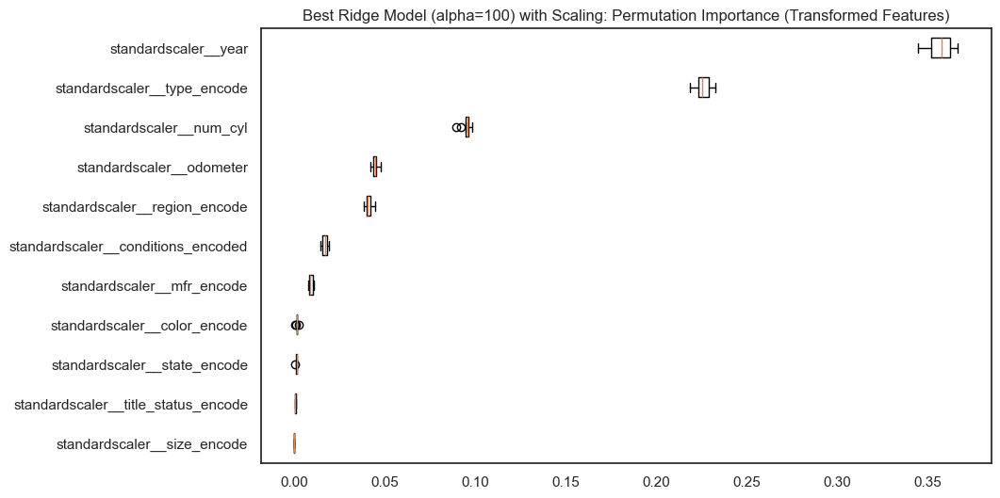

In [781]:


# Calculate the mean squared error for the best model
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

#append the results to the results dictionary
results['ridge_scaled_best'] = {'r2': ridge_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

best_alpha = grid_search.best_params_['ridge__alpha']

# Print the results
print(f"Best alpha: {grid_search.best_params_['ridge__alpha']}")
print(f'Best Ridge Score: {ridge_score: .5f}')
print(f'Best Mean Squared Error: {mse: .5f}')
print(f'Best Root Mean Squared Error: {rmse: .5f}')
print(f'Best Mean Absolute Error: {mae: .5f}')


# Plot the predictions
plot_predictions(y_test, y_pred, f'Best Ridge Model (alpha={best_alpha}) with Scaling')

# get the true perms
perm_importance_with_transformed_columns(best_model, 'ridge', X_test, y_test, f'Best Ridge Model (alpha={best_alpha}) with Scaling')

### Lasso with scaling

Lasso Scaled R^2:  0.64468
Lasso Scaled MSE:  43861322.09453
Lasso Scaled RMSE:  6622.78809
Lasso Scaled MAE:  4884.84544

                                Feature  Coefficient  Abs Coefficient
0                  standardscaler__year  4732.631468      4732.631468
7           standardscaler__type_encode  3771.272254      3771.272254
4               standardscaler__num_cyl  2393.077480      2393.077480
1              standardscaler__odometer -1684.806378      1684.806378
10        standardscaler__region_encode  1676.622243      1676.622243
5    standardscaler__conditions_encoded  1032.812762      1032.812762
2            standardscaler__mfr_encode   778.333732       778.333732
6          standardscaler__color_encode   250.059417       250.059417
9   standardscaler__title_status_encode  -202.115610       202.115610
3          standardscaler__state_encode  -200.852359       200.852359
8           standardscaler__size_encode   -39.678379        39.678379



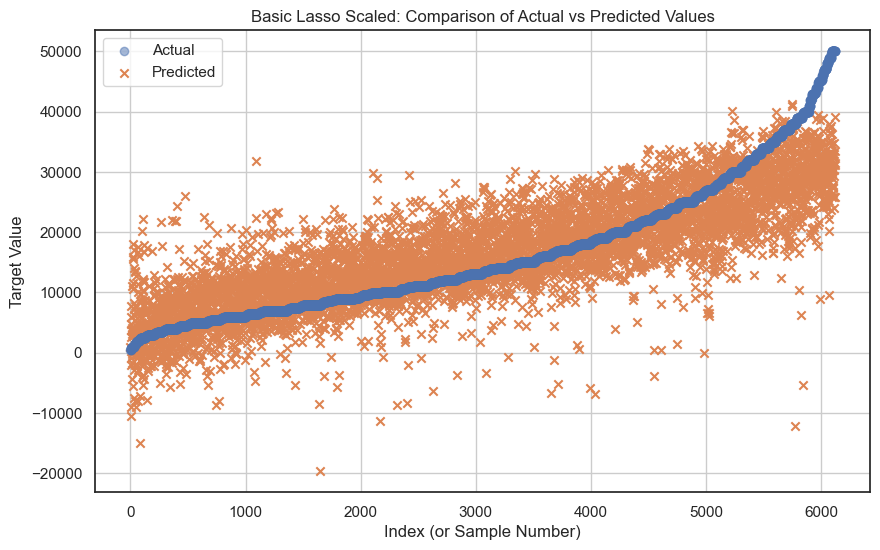

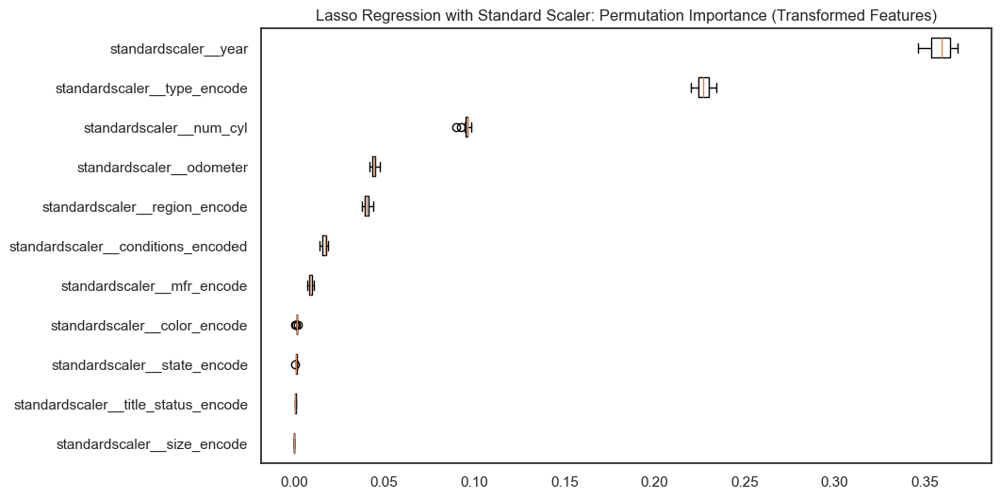

In [802]:
# build a pipeline which includes the lasso regression model with standard scaler
alpha=10

# build a pipeline which includes the lasso regression model
lasso = Lasso(alpha=alpha)

lasso_scaled = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('lasso', lasso)
])

# fit the lasso regression model with polynomial features
lasso_scaled.fit(X_train, y_train)

# evaluate the lasso regression model with polynomial features
lasso_score = lasso_scaled.score(X_test, y_test)

# calculate the mean squared error
y_pred = lasso_scaled.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

#append the results to the results dictionary
results[f'lasso_scaled (alpha={alpha})'] = {'r2': lasso_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

print(f'Lasso Scaled R^2: {lasso_score: .5f}')
print(f'Lasso Scaled MSE: {mse: .5f}')
print(f'Lasso Scaled RMSE: {rmse: .5f}')
print(f'Lasso Scaled MAE: {mae: .5f}')
print()

# Get the coefficients from the lasso model
coefficients = lasso_scaled.named_steps['lasso'].coef_

# Print the coefficients with column names
columns = preprocessor.get_feature_names_out()

coefficients_df = pd.DataFrame({'Feature': columns, 'Coefficient': coefficients, 'Abs Coefficient': np.abs(coefficients)})
coefficients_df_sorted = coefficients_df.reindex(coefficients_df['Coefficient'].abs().sort_values(ascending=False).index)

print(coefficients_df_sorted)
print()

#plot the predictions
plot_predictions(y_test, y_pred, 'Basic Lasso Scaled')

# get the true perms
perm_importance_with_transformed_columns(lasso_scaled, 'lasso', X_test, y_test, 'Lasso Regression with Standard Scaler')


### Lasso with different alphas


                                Feature  Coefficient  Abs Coefficient
0                  standardscaler__year  4681.771601      4681.771601
7           standardscaler__type_encode  3750.582281      3750.582281
4               standardscaler__num_cyl  2330.733554      2330.733554
1              standardscaler__odometer -1614.870411      1614.870411
10        standardscaler__region_encode  1519.185364      1519.185364
5    standardscaler__conditions_encoded   951.737571       951.737571
2            standardscaler__mfr_encode   753.718402       753.718402
6          standardscaler__color_encode   197.564139       197.564139
9   standardscaler__title_status_encode  -112.390722       112.390722
3          standardscaler__state_encode    -0.000000         0.000000
8           standardscaler__size_encode    -0.000000         0.000000

Best alpha: 100
Model R^2 score:  0.64281
Mean Squared Error:  44091994.20237
Root Mean Squared Error:  6640.18028
Mean Absolute Error:  4893.79392


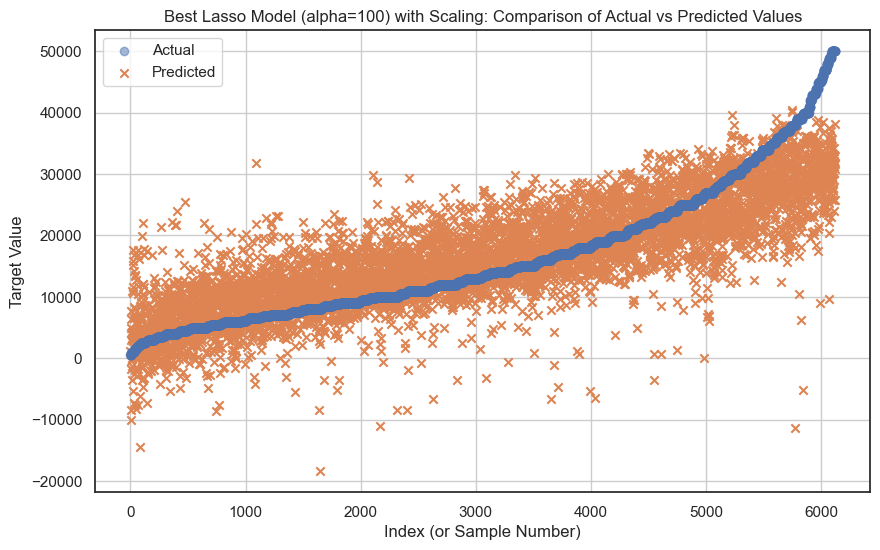

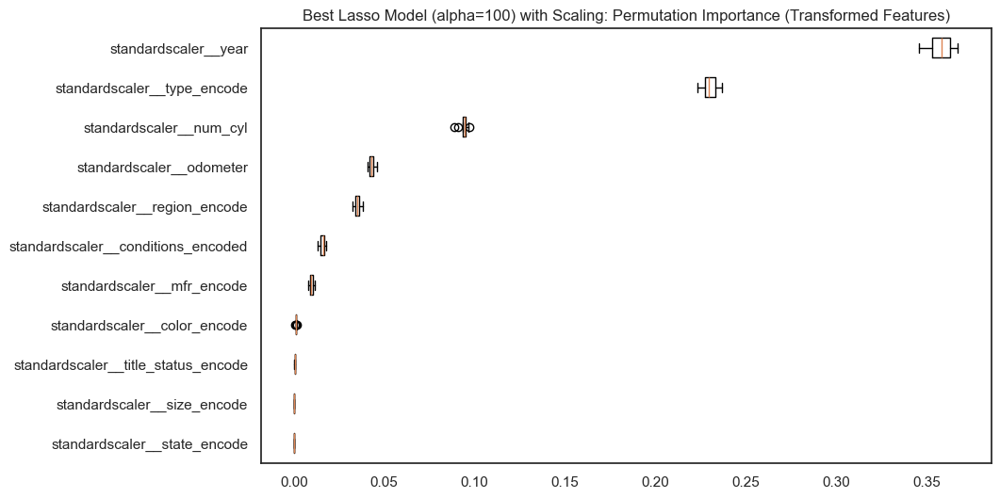

In [799]:
# Define the hyperparameter grid for alpha values
param_grid = {
    'lasso__alpha': [0.001, 0.01, 0.1, 1.0, 10, 100, 1000]  # Alpha values to test
}

# Set up the GridSearchCV with cross-validation
grid_search = GridSearchCV(lasso_scaled, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model using GridSearchCV
grid_search.fit(X_train, y_train)

# Get the best model and alpha
best_model = grid_search.best_estimator_
best_alpha = grid_search.best_params_['lasso__alpha']

# Evaluate the best model on the test set
ridge_score = best_model.score(X_test, y_test)

# Calculate the mean squared error for the best model
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)

# Get the coefficients of the best model
coefficients = best_model.named_steps['lasso'].coef_

# Print the coefficients with column names
columns = preprocessor.get_feature_names_out()

coefficients_df = pd.DataFrame({'Feature': columns, 'Coefficient': coefficients, 'Abs Coefficient': np.abs(coefficients)})
coefficients_df_sorted = coefficients_df.reindex(coefficients_df['Coefficient'].abs().sort_values(ascending=False).index)

print(coefficients_df_sorted)
print()

# Append the results to the results dictionary
results['lasso_scaled_best'] = {'r2': ridge_score, 'mse': mse, 'rmse': rmse, 'mae': mae}

# Print results
print(f"Best alpha: {best_alpha}")
print(f"Model R^2 score: {ridge_score: .5f}")
print(f"Mean Squared Error: {mse: .5f}")
print(f"Root Mean Squared Error: {rmse: .5f}")
print(f"Mean Absolute Error: {mae: .5f}")

# Get the model predictions for X_test
y_pred = best_model.predict(X_test)

# Plot the predictions
plot_predictions(y_test, y_pred, f'Best Lasso Model (alpha={best_alpha}) with Scaling')

# get the true perms
perm_importance_with_transformed_columns(best_model, 'lasso', X_test, y_test, f'Best Lasso Model (alpha={best_alpha}) with Scaling')



### Find the most important features and build a poly regression model

### GridSearch with Ridge

Best alpha: 1151.3953993264481

                                Feature  Coefficient  Abs Coefficient
0                  standardscaler__year  4504.618438      4504.618438
7           standardscaler__type_encode  3589.897768      3589.897768
4               standardscaler__num_cyl  2299.014232      2299.014232
1              standardscaler__odometer -1666.439490      1666.439490
10        standardscaler__region_encode  1654.939160      1654.939160
5    standardscaler__conditions_encoded  1029.809304      1029.809304
2            standardscaler__mfr_encode   882.607745       882.607745
6          standardscaler__color_encode   310.021003       310.021003
9   standardscaler__title_status_encode  -195.949427       195.949427
3          standardscaler__state_encode  -138.594306       138.594306
8           standardscaler__size_encode   -70.011055        70.011055

Intercept: 16340.439910130719
Ridge Train MSE:  44819283.16861
Ridge Train RMSE:  6694.72054
Ridge Test MSE:  44009944.44305
Ri

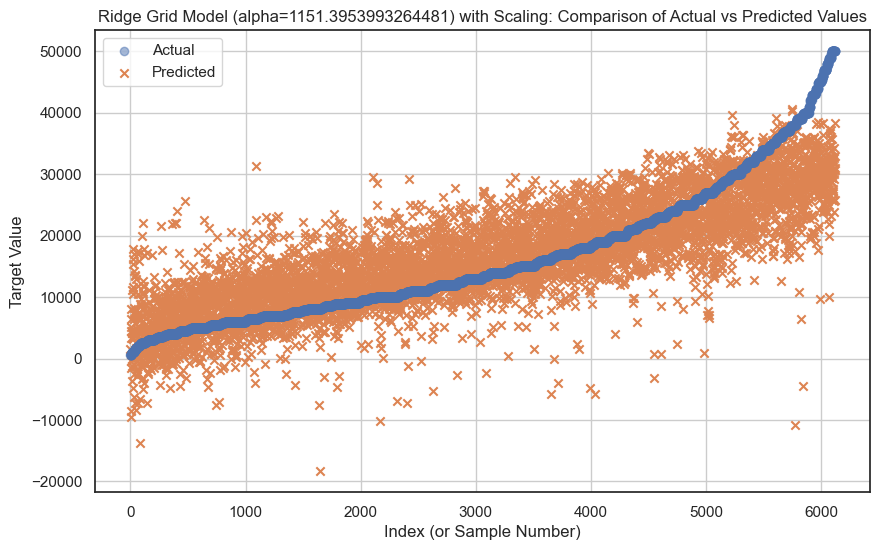

In [797]:
ridge_param_dict = {'ridge__alpha': np.logspace(0, 10, 50)}
ridge_pipe = Pipeline([('preprocessor', preprocessor),
                    ('scaler', StandardScaler()), 
                      ('ridge', Ridge())])
ridge_grid = GridSearchCV(ridge_pipe, param_grid=ridge_param_dict)
ridge_grid.fit(X_train, y_train)

# Get the best model from grid search
best_pipeline = ridge_grid.best_estimator_
best_alpha = best_pipeline.named_steps['ridge'].alpha
print(f"Best alpha: {best_alpha}")
print()

# Extract the Ridge model from the pipeline
best_ridge = best_pipeline.named_steps['ridge']

# Get the coefficients of the best model
coefficients = best_ridge.coef_
intercept = best_ridge.intercept_

# Print the coefficients with column names
#get the column names from the preprocessor
columns = best_pipeline.named_steps['preprocessor'].get_feature_names_out()
coefficients_df = pd.DataFrame({'Feature': columns, 'Coefficient': coefficients, 'Abs Coefficient': np.abs(coefficients)})
coefficients_df_sorted = coefficients_df.reindex(coefficients_df['Coefficient'].abs().sort_values(ascending=False).index)

print(coefficients_df_sorted)
print()
print("Intercept:", intercept)

ridge_train_preds = ridge_grid.predict(X_train)
ridge_test_preds = ridge_grid.predict(X_test)
ridge_train_mse = mean_squared_error(y_train, ridge_train_preds)
ridgr_train_rmse = np.sqrt(ridge_train_mse)
ridge_test_mse = mean_squared_error(y_test, ridge_test_preds)
ridge_test_rmse = np.sqrt(ridge_test_mse)
ridge_test_mae = mean_absolute_error(y_test, ridge_test_preds)

#append the results to the results dictionary
results[f'ridge_grid (alpha={best_alpha})'] = {'r2': ridge_grid.score(X_test, y_test), 'mse': ridge_test_mse, 'rmse': ridge_test_rmse, 'mae': ridge_test_mae}

print(f"Ridge Train MSE: {ridge_train_mse: .5f}")
print(f"Ridge Train RMSE: {ridgr_train_rmse: .5f}")
print(f"Ridge Test MSE: {ridge_test_mse: .5f}")
print(f"Ridge Test RMSE: {ridge_test_rmse: .5f}")
print(f"Ridge Test MAE: {ridge_test_mae: .5f}")

# Plot the predictions
plot_predictions(y_test, ridge_test_preds, f'Ridge Grid Model (alpha={best_alpha}) with Scaling')

# get the true perms
perm_importance_with_transformed_columns(best_pipeline, 'ridge', X_test, y_test, f'Ridge Grid Model (alpha={best_alpha}) with Scaling')



### SFS with Poly

In [811]:
# Using preprocessing steps from the previous section
sequential_pipe = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', StandardScaler()),
    ('poly_features', PolynomialFeatures(include_bias=False)),
    ('selector', SequentialFeatureSelector(LinearRegression())),
    ('linreg', LinearRegression())
])

# Define the parameter grid for the grid search
param_grid = {
    'poly_features__degree': [1,2,3],  # List of degrees to try for the polynomial features
    'selector__n_features_to_select': [3, 4, 5, 6]  # List of n_features_to_select values to try
}

# Set up the grid search with cross-validation
grid_search = GridSearchCV(sequential_pipe, param_grid, scoring='neg_mean_squared_error', cv=None, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

# You can also get the best estimator (pipeline) and use it for predictions
best_model = grid_search.best_estimator_


Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.3s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.2s
[CV] END poly_features__degree=1, selector__n_features_to_select=3; total time=   0.3s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.3s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.3s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.3s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.4s
[CV] END poly_features__degree=1, selector__n_features_to_select=4; total time=   0.4s
[CV] END poly_features__degree=1, selector__n_features_to_select=5; t

In [812]:
# re run with just the best parameters
degree = 2
n_features = 6

sequential_pipe = Pipeline([('preprocessor', preprocessor),
                            ('scaler', StandardScaler()),
                            ('poly_features', PolynomialFeatures(degree=degree, include_bias = False)),
                           ('selector', SequentialFeatureSelector(LinearRegression(), 
                                                                  n_features_to_select=n_features)),
                           ('linreg', LinearRegression())])
sequential_pipe.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  Index(['year', 'odometer', 'mfr_encode', 'state_encode', 'num_cyl',
       'conditions_encoded', 'color_encode', 'type_encode', 'size_encode',
       'title_status_encode', 'region_encode'],
      dtype='object'))])),
                ('scaler', StandardScaler()),
                ('poly_features', PolynomialFeatures(include_bias=False)),
                ('selector',
                 SequentialFeatureSelector(estimator=LinearRegression(),
                                           n_features_to_select=6)),
                ('linreg', LinearRegression())])

In [819]:
# Extract feature names after the preprocessor step
preprocessed_columns = sequential_pipe.named_steps['preprocessor'].get_feature_names_out()

# Generate polynomial feature names (manually for better understanding)
poly = sequential_pipe.named_steps['poly_features']
poly_feature_names = poly.get_feature_names_out(preprocessed_columns)

# Get the indices of the selected features
selector = sequential_pipe.named_steps['selector']
selected_indices = selector.get_support(indices=True)

# Get the names of the selected columns after polynomial feature generation
selected_columns = poly_feature_names[selected_indices]

# Get the coefficients from the linear regression model
coefficients = sequential_pipe.named_steps['linreg'].coef_

# Combine column names with coefficients for easy viewing
selected_features_with_coefficients = list(zip(selected_columns, coefficients))

# Display selected features with their coefficients
for feature, coef in selected_features_with_coefficients:
    print(f"Feature: {feature:50} Coefficient: {coef}")




Feature: standardscaler__year                               Coefficient: 7477.835456639632
Feature: standardscaler__num_cyl                            Coefficient: 2992.306901998296
Feature: standardscaler__type_encode                        Coefficient: 3440.3392025064772
Feature: standardscaler__region_encode                      Coefficient: 1347.6039340517375
Feature: standardscaler__year^2                             Coefficient: 1692.4531808440997
Feature: standardscaler__year standardscaler__num_cyl       Coefficient: 1173.0739290709048


In [814]:

sequential_train_mse = mean_squared_error(y_train, sequential_pipe.predict(X_train))
sequential_train_rmse = np.sqrt(sequential_train_mse)
sequential_test_mse = mean_squared_error(y_test, sequential_pipe.predict(X_test))
sequential_test_rmse = np.sqrt(sequential_test_mse)
sequential_test_mae = mean_absolute_error(y_test, sequential_pipe.predict(X_test))  

#append the results to the results dictionary
name = f'sequential(degree={degree}, n_features={n_features})'
results[name] = {'r2': sequential_pipe.score(X_test, y_test), 'mse': sequential_test_mse, 'rmse': sequential_test_rmse, 'mae': sequential_test_mae}

print(f'Sequential Train RMSE = {sequential_train_rmse}')
print(f'Sequential Test RMSE = {sequential_test_rmse}')
print(f'Sequential Train MSE = {sequential_train_mse}')
print(f'Sequential Test RMSE = {sequential_test_rmse}')
print(f'Sequential Test MAE = {sequential_test_mae}')

Sequential Train RMSE = 6382.973690964189
Sequential Test RMSE = 6308.4242845457065
Sequential Train MSE = 40742353.139541
Sequential Test RMSE = 6308.4242845457065
Sequential Test MAE = 4594.660225871094


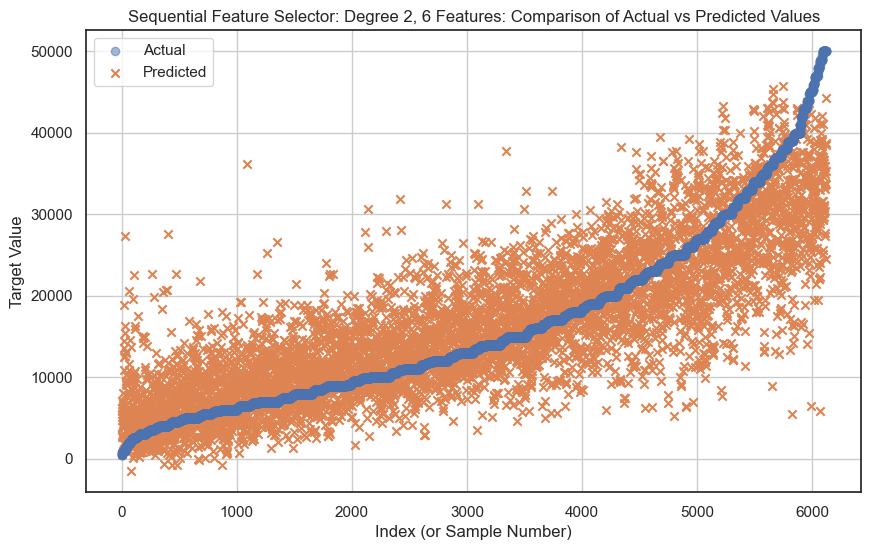

In [815]:

# plot the predictions against the test data
plot_predictions(y_test, sequential_pipe.predict(X_test), f'Sequential Feature Selector: Degree {degree}, {n_features} Features')


#### Compiling results from different models

In [816]:
# create a dataframe from the results dictionary
results_df = pd.DataFrame(results).T

#what is the average price for the test set
average_price = y_test.mean()
print(f"Average Car Price: ${average_price: .2f}")

#calculate the percentage error for each model
results_df['percent_error'] = round((100 * (results_df['mae'] / average_price)), 2)

# round all of the values to 2 decimal places
results_df = results_df.round(2)

#drop the mse column
results_df = results_df.drop('mse', axis=1)

#sort the dataframe by percent error
results_df = results_df.sort_values(by='percent_error')

print(results_df)

Average Car Price: $ 16480.33
                                         r2     rmse      mae  percent_error
sequential(degree=2, n_features=6)     0.68  6308.42  4594.66          27.88
linear_scaled                          0.64  6621.50  4884.45          29.64
ridge_scaled                           0.64  6621.51  4884.45          29.64
ridge_scaled_best                      0.64  6622.04  4884.78          29.64
lasso_scaled                           0.64  6621.62  4884.49          29.64
lasso_scaled (alpha=10)                0.64  6622.79  4884.85          29.64
lasso_scaled_best                      0.64  6640.18  4893.79          29.69
ridge_grid                             0.64  6634.00  4892.35          29.69
ridge_grid (alpha=1151.3953993264481)  0.64  6634.00  4892.35          29.69
sequential(degree=1, n_features=6)     0.61  6944.10  5147.92          31.24


# Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

#### Modeling Conclusions
In spite of having exhaustively searched the model space for the models I know how to build, I am not very satisfied with the rmse of $8119.19 against an average price of $16051.52.

The models have all selected the same top factors, which should reflect consistent analysis of the data, but the error is still very high.

Using MAE for evaluation: 
I went back and calculated the mean absolute error for each model output, and that is a lot better.  For the winning SFS with poly degree 4, this yields $5860.05 which is 36.51% of the average price.  Still not great, but improved.
I've decided to use MAE as the evaluation criteria since it maps directly to price, and is easy for the audience to understand.

##### Pass 2
Adding columns that weren't included in the modelling.
1. Target encode:  Region, Manufacturer, Type
2. Label encode: Condition, Title, Number of Cylinders

After rerunning everything with these columns available, the error was reduced to 31.96% for the best SFS poly model.  This, I believe, is quite useful.

##### Pass 3
Further refining the encoding and cleaning the data
1. Added target encoding: State, Color
2. Removed rows with sales price < $500

This really helped improve the model performance for all modelling methods.  For the SFS poly, it reduced the MAE to 27.88%

##### Pass 4
Try putting the outliers back in, at least for recent years.
Surpisingly, this did not improve the results. Tried 100k, 80k, 60k.  Came back to 50k as the sweet spot.

##### Selecting the model
Since the error of the models is very close now, I'm going to look at the selected features to determine which model to use for actual predictions going forward.  

Although the sfs poly model with order 2 and 6 features fared the best, it seems to me to overweight the year feature, since year is included in 3/6 of the chosen features:
<pre>
Feature: standardscaler__year                               Coefficient: 7477.835456639632
Feature: standardscaler__num_cyl                            Coefficient: 2992.306901998296
Feature: standardscaler__type_encode                        Coefficient: 3440.3392025064772
Feature: standardscaler__region_encode                      Coefficient: 1347.6039340517375
Feature: standardscaler__year^2                             Coefficient: 1692.4531808440997
Feature: standardscaler__year standardscaler__num_cyl       Coefficient: 1173.0739290709048
</pre>





### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.